##准备
包括下载clip依赖和将设置改为GPU

In [7]:
# ! pip install ftfy regex tqdm
# ! pip install git+https://github.com/openai/CLIP.git

In [1]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)

d:\Anaconda3\envs\pytorch\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Torch version: 1.12.0


##加载模型

In [2]:
import clip
clip.available_models()  # 这里展示可选择的不同图片特征提取器

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [3]:
#加载模型和图片处理器
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-L/14@336px', device)
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("模型参数:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("输入图片尺寸:", input_resolution)
print("文本长度:", context_length)
print("词表大小:", vocab_size)

模型参数: 427,944,193
输入图片尺寸: 336
文本长度: 77
词表大小: 49408


查看图片处理器 调整图片大小224*224，中心裁剪，然后使用均值和标准差进行归一化，最后输出tensor向量

In [4]:
preprocess

Compose(
    Resize(size=336, interpolation=bicubic, max_size=None, antialias=None)
    CenterCrop(size=(336, 336))
    <function _convert_image_to_rgb at 0x00000248216D19D0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

文本分词

In [5]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

输入图片和文本，并可视化

In [6]:
import os 
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format='retina'

descriptions = {
    "astronaut": "A color image of astronaut Eileen Collins.",
    "camera": "A famous black and white photograph of a man with a camera.",
    "chelsea": "A color image of a tabby cat.",
    "coffee": "A color photograph of a cup of coffee.",
    "motorcycle_left": "A left view of a red motorcycle standing in a garage.",
    "rocket": "A color image of a rocket launch."
}


['astronaut.png', 'brick.png', 'camera.png', 'cell.png', 'chelsea.png', 'chessboard_GRAY.png', 'chessboard_RGB.png', 'clock_motion.png', 'coffee.png', 'coins.png', 'color.png', 'grass.png', 'gravel.png', 'horse.png', 'hubble_deep_field.jpg', 'ihc.png', 'logo.png', 'microaneurysms.png', 'moon.png', 'motorcycle_left.png', 'motorcycle_right.png', 'page.png', 'phantom.png', 'retina.jpg', 'rocket.jpg', 'text.png']
26
brick
cell
chessboard_GRAY
chessboard_RGB
clock_motion
coins
color
grass
gravel
horse
hubble_deep_field
ihc
logo
microaneurysms
moon
motorcycle_right
page
phantom
retina
text


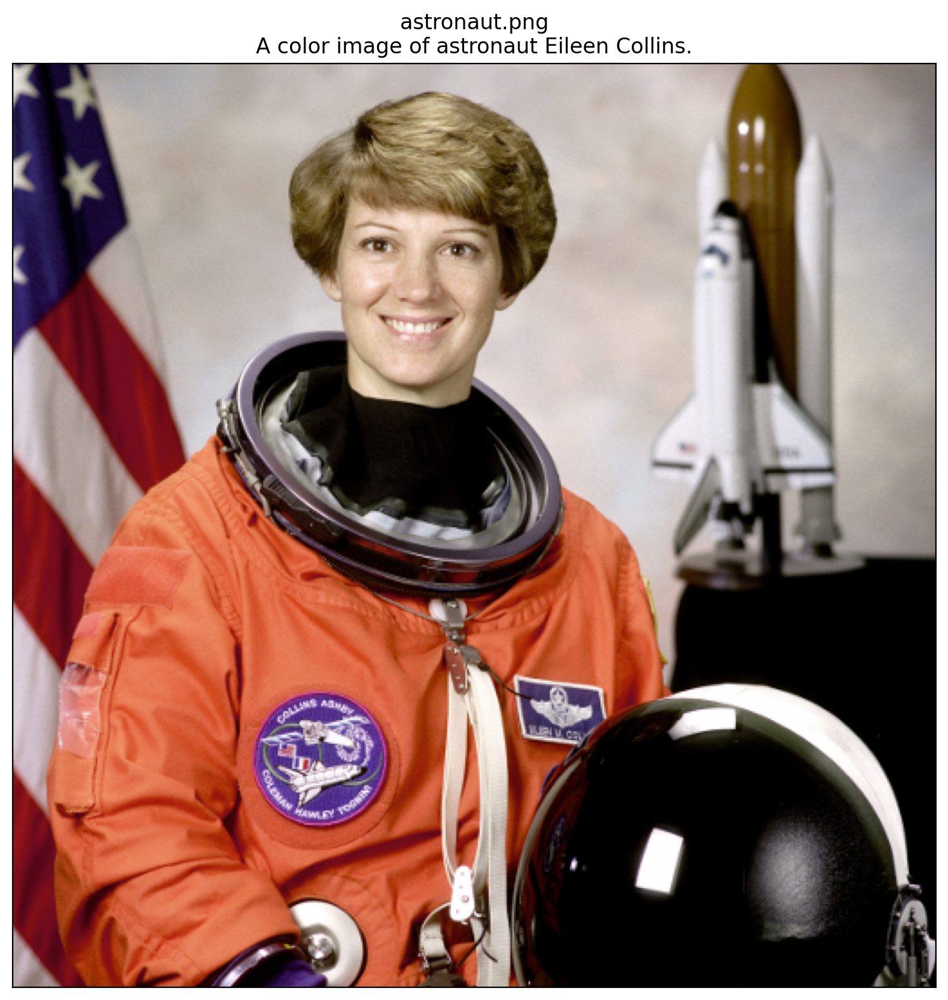

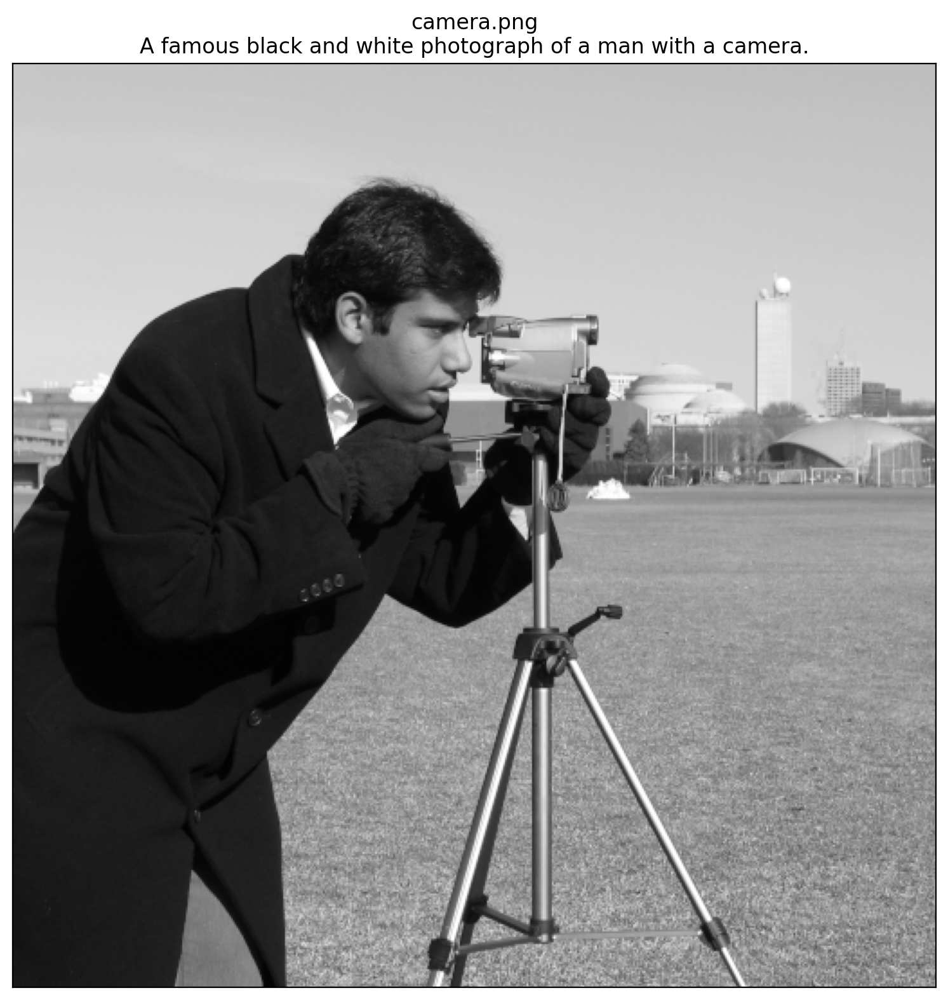

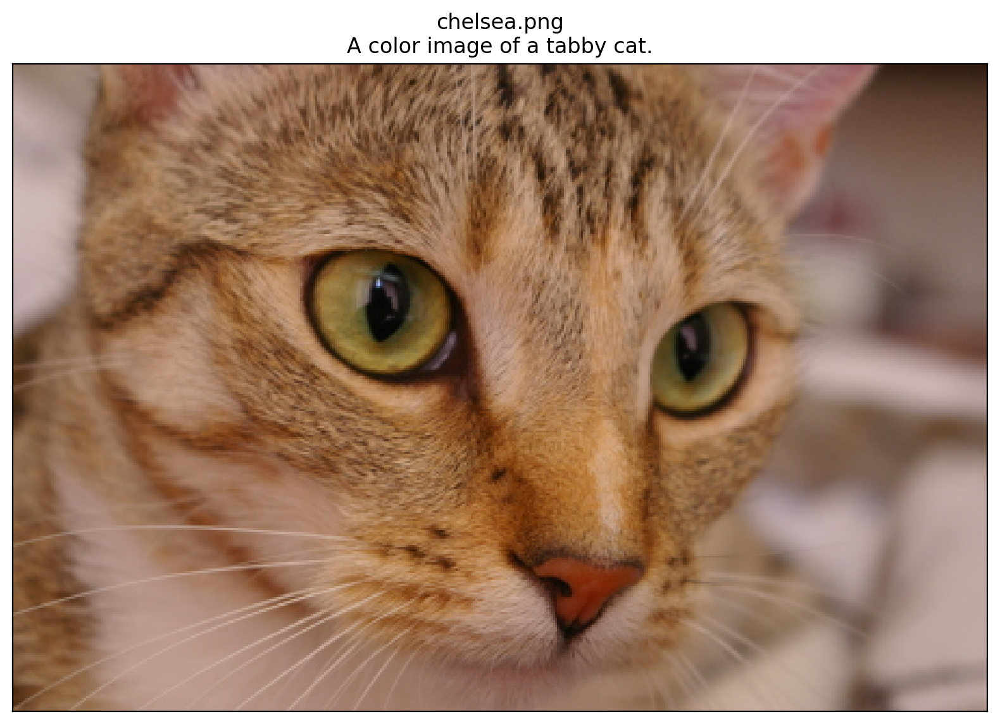

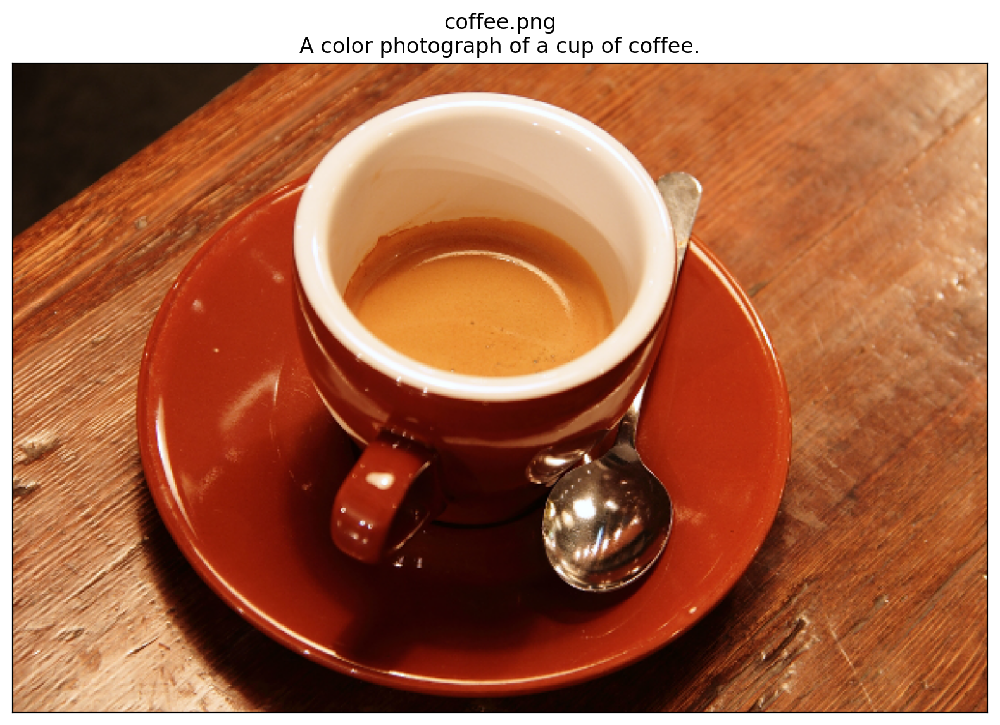

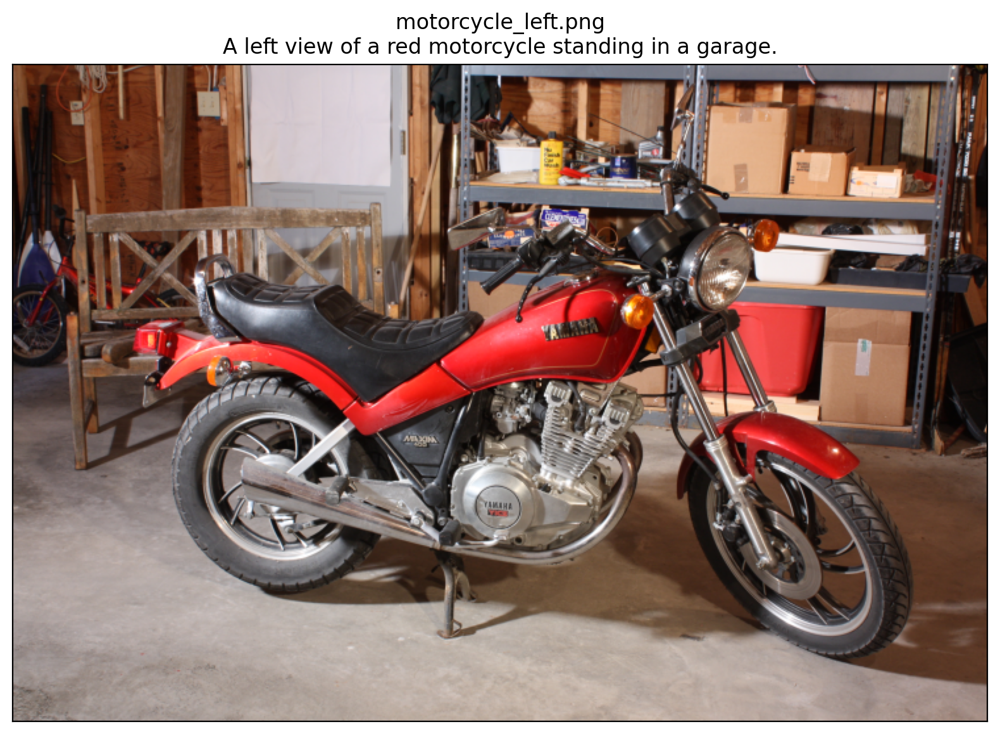

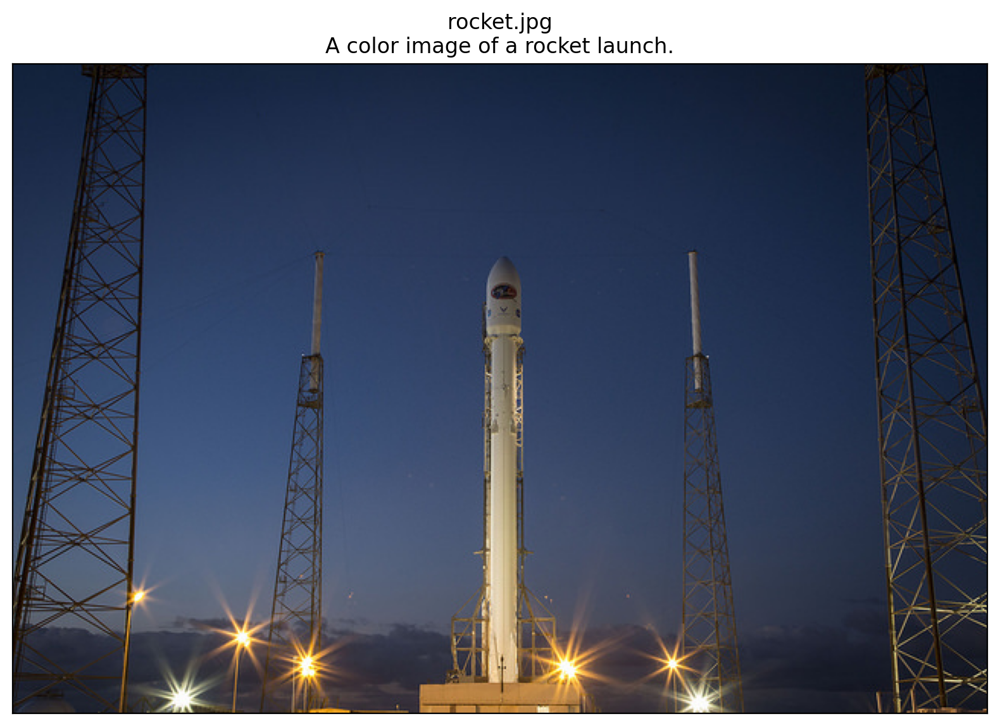

In [7]:
import math

original_images = []
images = []
texts = []

filtered_filenames = [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]
print(filtered_filenames)
print(len(filtered_filenames))

save_folder = "./skimage"

rows = math.ceil(len(filtered_filenames) / 4)

# 筛选skimage.data中的文件名，并展示
for idx, filename in enumerate(filtered_filenames):
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        print(name)
        continue
    
    save_path = os.path.join(save_folder, "{filename}_with_description.png")
    
    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")
    
    plt.figure(figsize=(8,8))
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.savefig(save_path)

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

将图片和文字encode生成特征

In [8]:
image_input = torch.tensor(np.stack(images)).cuda()

text_tokens = clip.tokenize(['This is '+ desc for desc in texts]).cuda() # 对文本描述进行 tokenization

with torch.no_grad(): # 使用模型对图像和文本特征进行编码
  image_features = model.encode_image(image_input).float()
  text_features = model.encode_text(text_tokens).float()

计算cosine相似度，并绘制

In [9]:
# 对图像和文本特征进行 L2 归一化
image_features /= image_features.norm(dim = -1, keepdim=True)
text_features /= text_features.norm(dim = -1, keepdim=True) 

similarity = text_features.cpu().numpy()@image_features.cpu().numpy().T # 计算文本和图像特征之间的余弦相似度

Text(0.5, 1.0, 'Cosine similarity between text and image features')

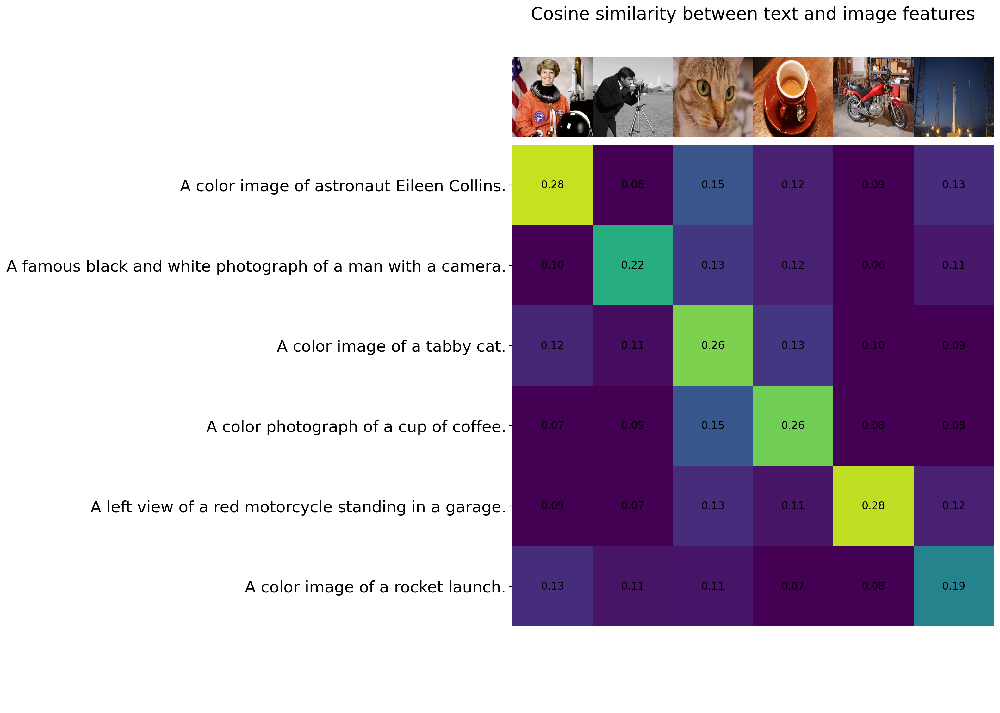

In [10]:
count=len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent = (i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)

零样本进行图片分类
数据集CIFAR100（主要为了使用它的类），使用相似度计算得分，然后softmax

In [11]:
from torchvision.datasets import CIFAR100, CIFAR10
import torchvision.transforms as transforms

dataset_path = os.path.join(os.getcwd(), "dataset")
os.makedirs(dataset_path, exist_ok=True)

cifar10 = CIFAR10(dataset_path, train=False, download=True)
cifar100 = CIFAR100(dataset_path, train=False, download=True)

Files already downloaded and verified
Files already downloaded and verified


In [12]:
# 根据 CIFAR100 数据集的类别创建描述文本，然后对描述文本进行 tokenization
text_descriptions = [f"This is a photo of a {label}" for label in cifar100.classes]
text_tokens = clip.tokenize(text_descriptions).cuda()

In [13]:
#计算文本特征和相似度得分
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim = -1, keepdim = True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim = -1)
top_probs, top_labels = text_probs.cpu().topk(5, dim = -1) # 获取概率值和对应的前 5 个标签

绘制原图和对应的概率图

In [14]:
for i, image in enumerate(original_images):
    fig, ax = plt.subplots(1, 2, figsize=(16, 4))

    ax[0].imshow(image)
    ax[0].axis("off")

    y = np.arange(top_probs.shape[-1])
    ax[1].grid()
    ax[1].barh(y, top_probs[i])
    ax[1].invert_yaxis()
    ax[1].set_axisbelow(True)
    ax[1].set_yticks(y)
    ax[1].set_yticklabels([cifar100.classes[index] for index in top_labels[i].numpy()])
    ax[1].set_xlabel("probability")

    plt.subplots_adjust(wspace=1)
    plt.savefig(f'experiment/skimage/result_{i}.png', bbox_inches='tight')
    plt.close(fig)

编写函数进行图片分类 输入图片和供选择标签进行分类

In [22]:
def clip_classifier(image_path, choice_label, top_k=5):
  #top_k小于choice_label数
  if top_k > len(choice_label):
    raise Exception('top_k大于候选标签数')

  #读取图片
  image = Image.open(image_path).convert("RGB")
  #输入特征
  text_descriptions = [f"This is a photo of a {label}" for label in choice_label]
  text_tokens = clip.tokenize(text_descriptions).cuda()
  image_input=preprocess(image)
  image_input=image_input.clone().detach().cuda()

  with torch.no_grad():
    image_features=model.encode_image(image_input.unsqueeze(0)).float()
    text_features=model.encode_text(text_tokens).float()

    image_features/=image_features.norm(dim=-1,keepdim=True)
    text_features/=text_features.norm(dim=-1,keepdim=True)

  #相似度得分
  text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
  top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)
  show_result(image,top_probs,top_labels,choice_label)


def show_result(image,probs,labels,label_name):
  plt.figure()
  plt.subplot(1, 2, 1)
  plt.imshow(image)
  plt.axis("off")

  plt.subplot(1, 2, 2)
  y = np.arange(probs.shape[-1])
  plt.grid()
  plt.barh(y, probs[0])
  plt.gca().invert_yaxis()
  plt.gca().set_axisbelow(True)
  plt.yticks(y, [label_name[index] for index in labels[0].numpy()])
  plt.xlabel("probability")

  plt.subplots_adjust(wspace=0.5)
  plt.show()

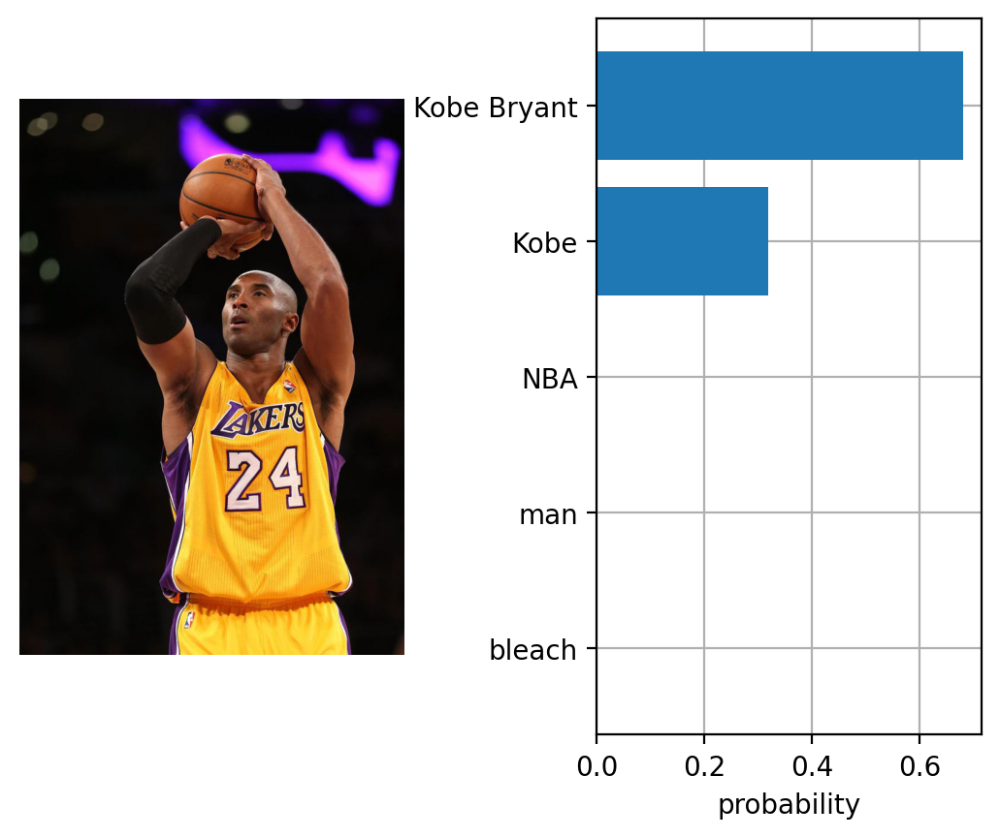

In [23]:
#测试函数
clip_classifier('./nba/kobe.jpg',['cat','pig','boy','girl','one_piece','bleach','black','man','NBA','Kobe','Kobe Bryant'])

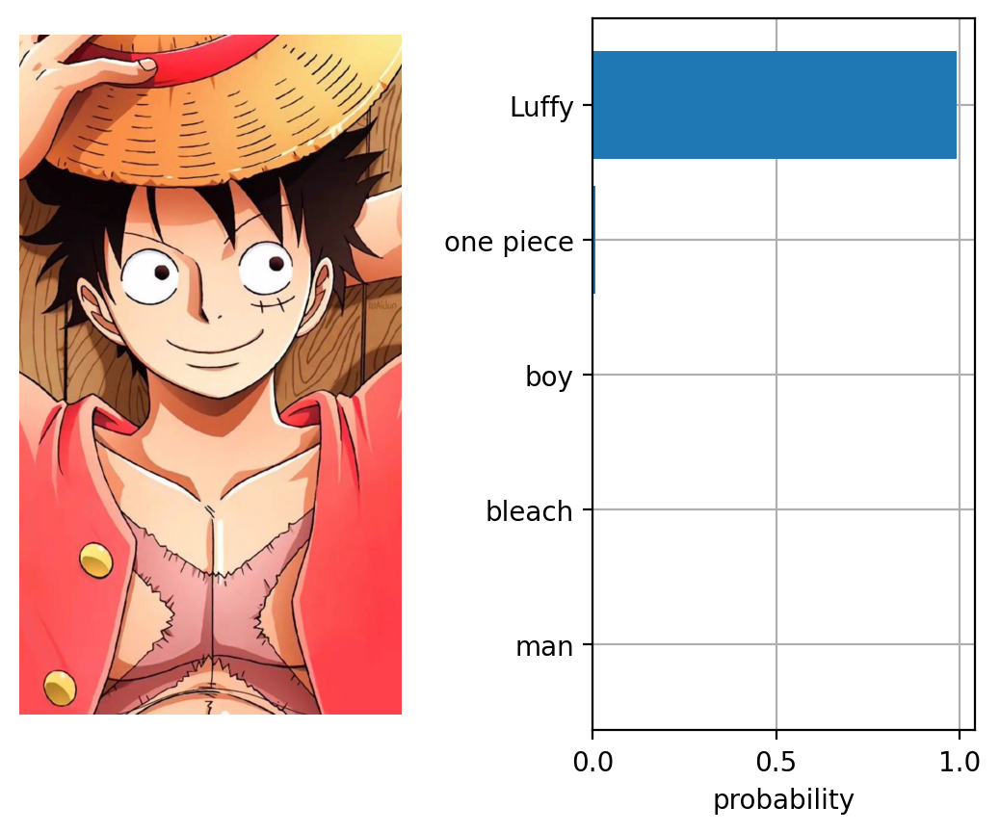

In [24]:
clip_classifier('lufei.jpg',['Luffy','pig','boy','girl','one piece','bleach','black','man','NBA','Kobe','Kobe Bryant'])

编写函数对文件夹中多图片进行分类

In [25]:
def clip_classifier_m(image_dir, subfolder, choice_label, top_k=5):
    # image_dir不为文件夹
    if not os.path.isdir(image_dir):
        raise Exception(image_dir + ' 应该为一个图片文件夹')

    # top_k小于choice_label数
    if top_k > len(choice_label):
        raise Exception('top_k大于候选标签数')

    # 读取图片
    original_images = []
    images = []

    for filename in [filename for filename in os.listdir(image_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
        image = Image.open(os.path.join(image_dir, filename)).convert("RGB")

        original_images.append(image)
        images.append(preprocess(image))

    # 输入特征
    text_descriptions = [f"This is a photo of a {label}" for label in choice_label]
    text_tokens = clip.tokenize(text_descriptions).cuda()

    image_input = torch.tensor(np.stack(images)).cuda()

    with torch.no_grad():
        image_features = model.encode_image(image_input).float()
        text_features = model.encode_text(text_tokens).float()

        image_features /= image_features.norm(dim = -1, keepdim=True)
        text_features /= text_features.norm(dim = -1, keepdim=True)

    # 相似度得分
    text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    top_probs, top_labels = text_probs.cpu().topk(top_k, dim = -1)
    show_result_m(subfolder, original_images, top_probs, top_labels, choice_label)
    print("done!")


def show_result_m(subfolder, images, probs, labels, label_name):
    os.makedirs(f'experiment/{subfolder}', exist_ok=True)

    for i, image in enumerate(images):
        fig, ax = plt.subplots(1, 2, figsize=(16, 4))

        ax[0].imshow(image)
        ax[0].axis("off")

        y = np.arange(probs.shape[-1])
        ax[1].grid()
        ax[1].barh(y, probs[i])
        ax[1].invert_yaxis()
        ax[1].set_axisbelow(True)
        ax[1].set_yticks(y)
        ax[1].set_yticklabels([label_name[index] for index in labels[i].numpy()])
        ax[1].set_xlabel("probability")

        plt.subplots_adjust(wspace=1)
        plt.savefig(f'experiment/{subfolder}/result_{i}.png', bbox_inches='tight')
        plt.close(fig)

In [26]:
clip_classifier_m('cifar10', 'cifar10', ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"])

done!


In [27]:
clip_classifier_m('nba', 'nba', ['Allen Iverson', 'Kawaii Leonard', 'Kyrie Lrving', 'Dwyane Wade', 'Tracy McGrady', 'Stephen Curry','Kevin Durant','James Harden','Lebron James', 'man','NBA','Kobe Bryant','Derick Rose', 'Russle Westbrook'])

done!


In [28]:
from tqdm import tqdm

def test(cifar):
    correct = 0

    for i in tqdm(range(0, len(cifar)), desc="Processing", ncols=100):
        image, class_id = cifar[i]
        image_input = preprocess(image).unsqueeze(0).to(device)
        text_inputs = torch.cat([clip.tokenize(f"a photo of a {c}") for c in cifar.classes]).to(device)

        # Calculate features
        with torch.no_grad():
            image_features = model.encode_image(image_input)
            text_features = model.encode_text(text_inputs)

        # Pick the top 5 most similar labels for the image
        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)
        similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
        values, indices = similarity[0].topk(5)

        if indices[0] == class_id:
            correct += 1

    accuracy = 100 * correct / len(cifar)
    return accuracy

In [29]:
print(f'CIFAR10: {len(cifar10)}')
print(f'CIFAR100: {len(cifar100)}')

cifar10_accuracy = test(cifar10)
cifar100_accuracy = test(cifar100)

print(f'CIFAR10 Test Accuracy: {cifar10_accuracy:.2f}%')
print(f'CIFAR100 Test Accuracy: {cifar100_accuracy:.2f}%')


CIFAR10: 10000
CIFAR100: 10000


Processing: 100%|███████████████████████████████████████████| 10000/10000 [1:05:21<00:00,  2.55it/s]

CIFAR10 Test Accuracy: 94.97%
CIFAR100 Test Accuracy: 72.00%
